# Something of a Painter Myself

This project aims to develop a generative adversarial network (GAN) that can generate images of paintings in the style of Claude Monet as part of the [I’m Something of a Painter Myself](https://www.kaggle.com/competitions/gan-getting-started/overview) Kaggle competition.

GANs are a type of unsupervised deep learning model that can generate a new dataset which is similar to a given dataset. The model architecture consists of two neural networks, a generator and a discriminator, which are trained together in a competitive, adversarial process. The generator generates new samples, while the discriminator tries to distinguish between the generated and real samples. As the generator improves, the discriminator improves as well, leading to a model that can generate realistic samples.

This project uses a dataset of 300 images of Monet paintings and 7038 images of photographs of landscapes. All images are 256x256 pixels and are in both JPEG and TFRecord formats. The generator will be trained to convert photographs into Monet-style paintings, while the discriminator will be trained to distinguish between real Monet paintings and generated Monet paintings.

## Setup

We'll begin by importing the necessary libraries and modules, loading the data, and inspecting the number of images in each dataset.

In [62]:
# Importing libraries and modules
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras import layers, Model

In [63]:
# Loading the data
base_path = '/Users/kevin.katzmann/Dropbox/School/CU Boulder/Courses/DTSA-5511/Week 5/something-of-a-painter-myself/'

monet_tfrec_path = base_path + 'data/monet_tfrec'
monet_jpg_path = base_path + 'data/monet_jpg'
photo_tfrec_path = base_path + 'data/photo_tfrec'
photo_jpg_path = base_path + 'data/photo_jpg'

monet_tfrec_files = [monet_tfrec_path + '/' + f for f in os.listdir(monet_tfrec_path)]
photo_tfrec_files = [photo_tfrec_path + '/' + f for f in os.listdir(photo_tfrec_path)]
monet_jpg_files = [monet_jpg_path + '/' + f for f in os.listdir(monet_jpg_path)]
photo_jpg_files = [photo_jpg_path + '/' + f for f in os.listdir(photo_jpg_path)]

print('Monet TFRecord files:', len(monet_tfrec_files))
print('Photo TFRecord files:', len(photo_tfrec_files))
print('Monet JPG files:', len(monet_jpg_files))
print('Photo JPG files:', len(photo_jpg_files))

Monet TFRecord files: 5
Photo TFRecord files: 20
Monet JPG files: 300
Photo JPG files: 7038


## Exploratory Data Analysis

The exploratory data analysis (EDA) section will involve loading the datasets, displaying examples of the Monet paintings and photographs, and visualizing the distribution of pixel values in the images.

In [64]:
# Loading TFRecords
IMAGE_SIZE = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    return dataset

monet_dataset = load_dataset(monet_tfrec_files)
photo_dataset = load_dataset(photo_tfrec_files)

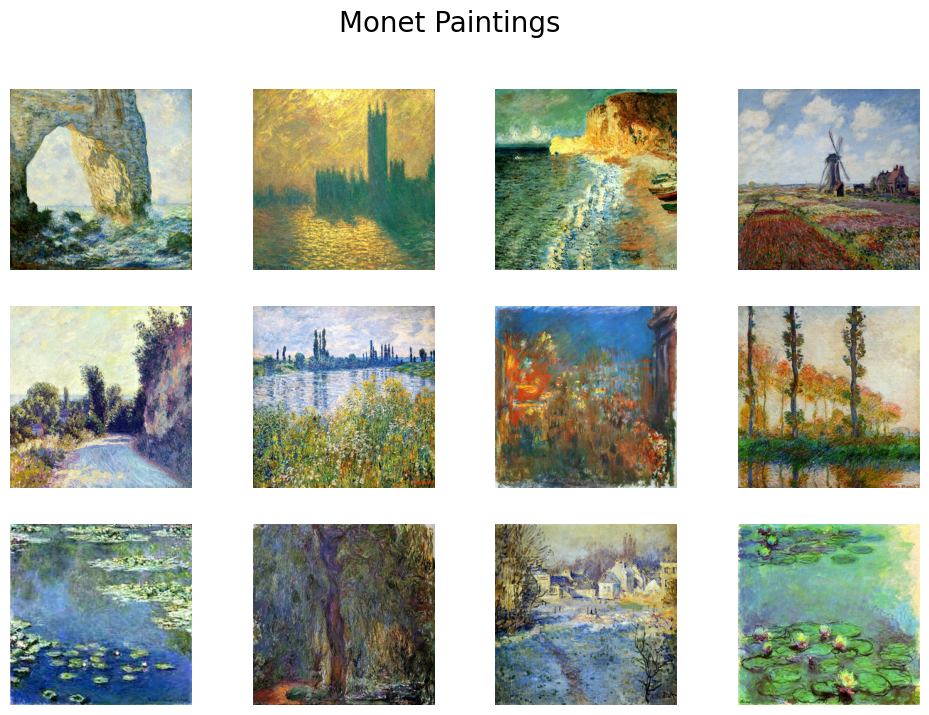

In [65]:
# Monet paintings
plt.figure(figsize=(12, 8))
for i, img in enumerate(monet_dataset.take(12)):
    plt.subplot(3, 4, i + 1)
    plt.imshow((img + 1) / 2)
    plt.axis('off')
plt.suptitle('Monet Paintings', fontsize=20)
plt.show()

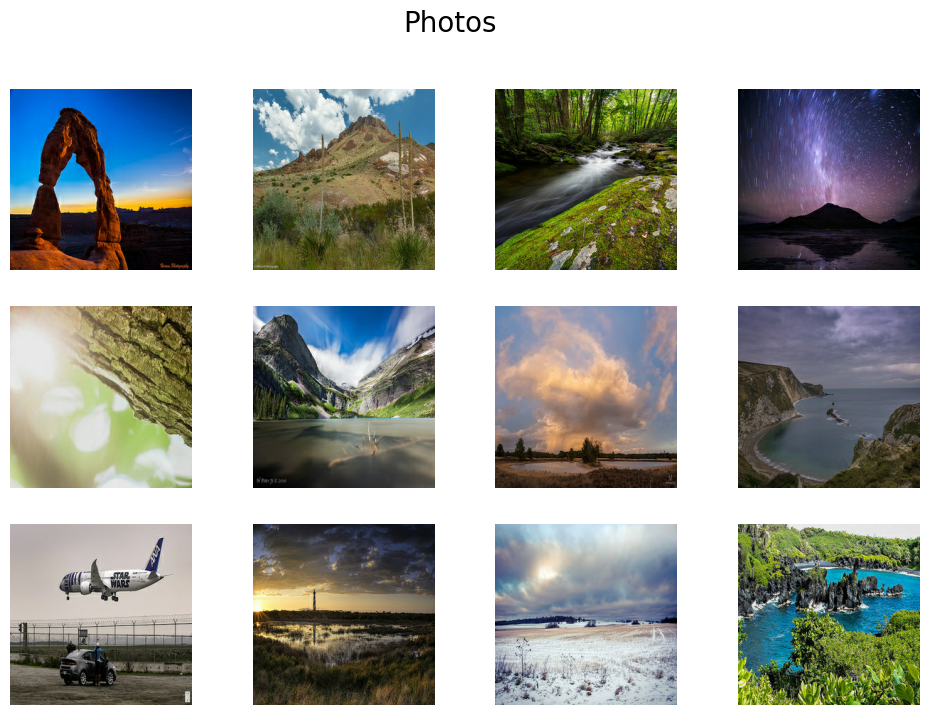

In [66]:
# Photos
plt.figure(figsize=(12, 8))
for i, img in enumerate(photo_dataset.take(12)):
    plt.subplot(3, 4, i + 1)
    plt.imshow((img + 1) / 2)
    plt.axis('off')
plt.suptitle('Photos', fontsize=20)
plt.show()

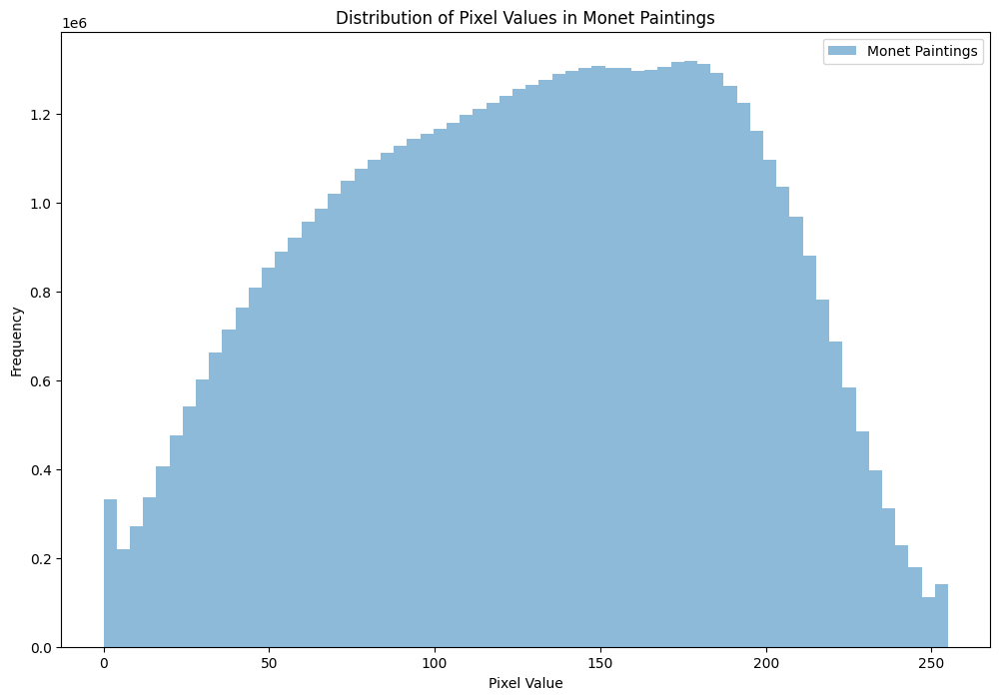

In [67]:
# Distribution of pixel values in Monet paintings
def flatten_and_concatenate(dataset):
    pixel_values = []
    for img in dataset:
        # rescale pixel values to [0, 255]
        img = (img + 1) * 127.5
        # convert to numpy array and flatten
        pixel_values.append(img.numpy().flatten())
    return np.concatenate(pixel_values)

monet_pixel_values = flatten_and_concatenate(monet_dataset)

plt.figure(figsize=(12, 8))
plt.hist(monet_pixel_values, bins=64, alpha=0.5, label='Monet Paintings')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Distribution of Pixel Values in Monet Paintings')
plt.legend()
plt.show()

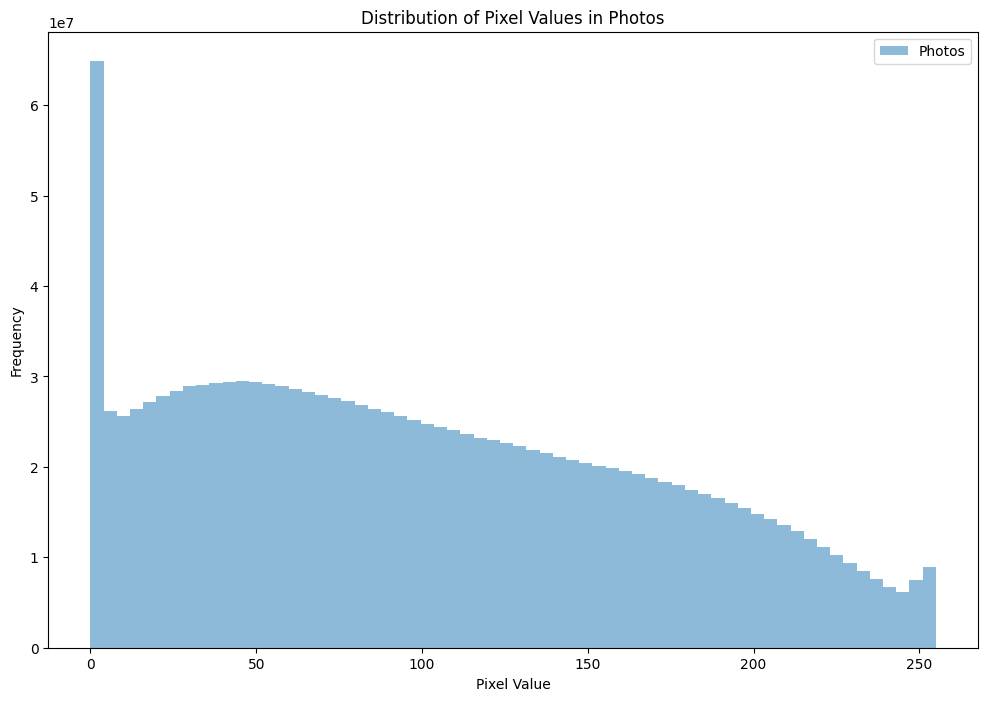

In [68]:
# Distribution of pixel values in photos
photo_pixel_values = flatten_and_concatenate(photo_dataset)

plt.figure(figsize=(12, 8))
plt.hist(photo_pixel_values, bins=64, alpha=0.5, label='Photos')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Distribution of Pixel Values in Photos')
plt.legend()
plt.show()

In [69]:
# Add batch and shuffle
monet_dataset = monet_dataset.batch(1, drop_remainder=True)
photo_dataset = photo_dataset.batch(1, drop_remainder=True)

After inspecting the Monet paintings and photographs and the distributions of their pixel values, we can see that the Monet paintings have a more limited color palette and are more abstract than the photographs. The photographs, on the other hand, have a larger color palette and are more detailed and realistic.

## Model Architecture

The GAN model architecture will consist of a generator and a discriminator. The generator will take a photograph as input and output an image that is the same size as the Monet paintings. The discriminator will take an image as input and output a probability that the image is a real Monet painting.

### Generator

The generator model we will use will consist of a series of convolutional layers followed by batch normalization and leaky ReLU activation functions. The final layer will be a convolutional layer with a tanh activation function to output an image. It will also use skip connections to improve the model's performance by allowing the model to learn both low-level and high-level features and helping to avoid the vanishing gradient problem.

### Discriminator

The discriminator model will consist of a series of convolutional layers followed by batch normalization and ReLU activation functions. The final layer will be another convolutional layer. Higher values in the final layer indicate that the image is more likely to be a real Monet painting, while lower values indicate that the image is more likely to be a fake Monet painting.

In [70]:
# Define the Generator model
def downstack_block(filters, size=(4, 4), apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    result.add(layers.LeakyReLU())
    return result

def upstack_block(filters, size=(4, 4), apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    result.add(layers.BatchNormalization())
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    result.add(layers.ReLU())
    return result

def build_generator():
    # Input layer
    inputs = layers.Input(shape=[256, 256, 3])

    # Encoder/Downsampling
    downstack = [
        downstack_block(64, apply_batchnorm=False),
        downstack_block(128),
        downstack_block(256),
        downstack_block(512),
        downstack_block(512),
        downstack_block(512),
        downstack_block(512),
        downstack_block(512)
    ]

    # Decoder/Upsampling
    upstack = [
        upstack_block(512, apply_dropout=True),
        upstack_block(512, apply_dropout=True),
        upstack_block(512, apply_dropout=True),
        upstack_block(512),
        upstack_block(256),
        upstack_block(128),
        upstack_block(64)
    ]

    # Skip connections
    x = inputs

    skips = []
    for down in downstack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Add the layers to the model
    for up, skip in zip(upstack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
    x = layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', activation='tanh')(x)

    return Model(inputs=inputs, outputs=x)


# Build and summarize the generator model
generator = build_generator()
generator.summary()

Model: "functional_408"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      3,072 │ input_layer_17[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_18       │ (None, 16, 16,    │  2,099,200 │ sequential_17[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_19       │ (None, 8, 8, 512) │  4,196,352 │ sequential_18[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_20       │ (None, 4, 4, 512) │  4,196,352 │ sequential_19[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_21       │ (None, 2, 2, 512) │  4,196,352 │ sequential_20[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_22       │ (None, 1, 1, 512) │  4,196,352 │ sequential_21[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_23       │ (None, 2, 2, 512) │  4,196,352 │ sequential_22[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 2, 2,      │          0 │ sequential_23[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_21[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_24       │ (None, 4, 4, 512) │  8,390,656 │ concatenate_7[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 4, 4,      │          0 │ sequential_24[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_20[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_25       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_8[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 8, 8,      │          0 │ sequential_25[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_19[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_26       │ (None, 16, 16,    │  8,390,656 │ concatenate_9[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 16, 16,    │          0 │ sequential_26[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [71]:
# Define the Discriminator model
def build_discriminator():
    inputs = layers.Input(shape=[256, 256, 3])

    x = inputs

    x = layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(512, (4, 4), strides=(2, 2), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(1, (4, 4), strides=(1, 1), padding='valid')(x)

    return Model(inputs=inputs, outputs=x)

# Build and summarize the discriminator model
discriminator = build_discriminator()
discriminator.summary()

/Users/kevin.katzmann/.pyenv/versions/data_science/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_33 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 128, 128, 64)   │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 64, 64, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 32, 32, 256)    │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 16, 16, 512)    │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 16, 16, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 13, 13, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,768,321 (10.56 MB)

 Trainable params: 2,766,529 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

## Model Training

The model will be trained using the Adam optimizer with a learning rate of 0.0002 and a beta_1 value of 0.5. The loss function will be binary cross-entropy, which is commonly used for GANs. The training process will involve alternating between training the discriminator and the generator. It will be trained for 40 epochs, with a batch size of 1.

This model was tuned to achieve the best results by experimenting with different hyperparameters, such as the learning rate, batch size, and number of epochs. In preliminary experiments, the model was trained for 20, 40 and 100 epochs, and learning rates of 0.0001, 0.0002. The best results were achieved with 40 epochs, a batch size of 1, and a learning rate of 0.0002.

In [ ]:
# Define the loss functions
LAMBDA = 10

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = tf.losses.BinaryCrossentropy(from_logits=True)
    l1_loss = tf.losses.MeanAbsoluteError()
    gan_loss = gan_loss(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = l1_loss(target, gen_output)
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    gan_loss = tf.losses.BinaryCrossentropy(from_logits=True)
    real_loss = gan_loss(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = gan_loss(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

# Define the optimizers
generator_optimizer = tf.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.optimizers.Adam(2e-4, beta_1=0.5)

# Define the training loop
EPOCHS = 40

def generate_images(model, test_input):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(12, 12))
    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']
    for i in range(2):
        plt.subplot(1, 2, i + 1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

@tf.function
def train_step(photo, monet):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(photo, training=True)

        disc_real_output = discriminator(monet, training=True)
        disc_generated_output = discriminator(gen_output, training=True)

        gen_loss = generator_loss(disc_generated_output, gen_output, monet)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss

# checkpoints
checkpoint_dir = base_path + 'checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

def train(train_ds, epochs):
    history = []
    for epoch in range(epochs):
        gen_loss_list = []
        disc_loss_list = []

        for photo, monet in tqdm(train_ds):
            gen_loss, disc_loss = train_step(photo, monet)
            gen_loss_list.append(gen_loss)
            disc_loss_list.append(disc_loss)

        print(f'Epoch {epoch + 1}, gen loss={np.mean(gen_loss_list)}, disc loss={np.mean(disc_loss_list)}')
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
            for photo, monet in train_ds.take(1):
                generate_images(generator, photo)
        history.append((np.mean(gen_loss_list), np.mean(disc_loss_list)))
    return history


300it [01:16,  3.90it/s]


Epoch 1, gen loss=4.819124221801758, disc loss=1.4188584089279175


300it [01:12,  4.15it/s]


Epoch 2, gen loss=5.221383571624756, disc loss=1.2156493663787842


300it [01:09,  4.31it/s]


Epoch 3, gen loss=5.420129299163818, disc loss=1.1755980253219604


300it [01:10,  4.25it/s]


Epoch 4, gen loss=5.597559928894043, disc loss=1.139302372932434


300it [01:09,  4.29it/s]


Epoch 5, gen loss=5.652311325073242, disc loss=1.0878612995147705


300it [01:09,  4.32it/s]


Epoch 6, gen loss=5.6059722900390625, disc loss=1.1275568008422852


300it [01:09,  4.31it/s]


Epoch 7, gen loss=5.46014404296875, disc loss=1.1975576877593994


300it [01:09,  4.30it/s]


Epoch 8, gen loss=5.511162281036377, disc loss=1.1684207916259766


300it [01:08,  4.35it/s]


Epoch 9, gen loss=5.471577167510986, disc loss=1.2058994770050049


300it [01:09,  4.30it/s]


Epoch 10, gen loss=5.513995170593262, disc loss=1.1881389617919922


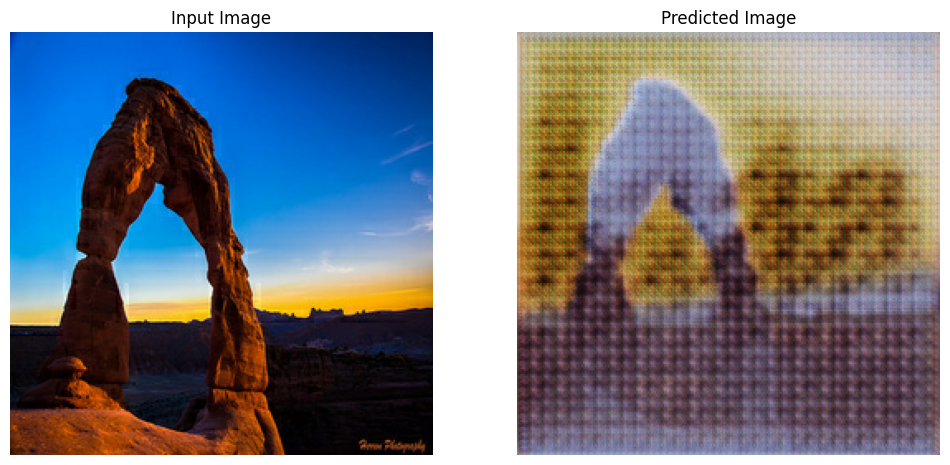

300it [01:10,  4.27it/s]


Epoch 11, gen loss=5.466726779937744, disc loss=1.2236676216125488


300it [01:09,  4.33it/s]


Epoch 12, gen loss=5.494778633117676, disc loss=1.210119366645813


300it [01:09,  4.33it/s]


Epoch 13, gen loss=5.548305034637451, disc loss=1.1909921169281006


300it [01:08,  4.35it/s]


Epoch 14, gen loss=5.458437442779541, disc loss=1.1826001405715942


300it [01:09,  4.30it/s]


Epoch 15, gen loss=5.481222152709961, disc loss=1.1975635290145874


300it [01:08,  4.36it/s]


Epoch 16, gen loss=5.460693359375, disc loss=1.1960864067077637


300it [01:09,  4.33it/s]


Epoch 17, gen loss=5.430834770202637, disc loss=1.2020069360733032


300it [01:09,  4.32it/s]


Epoch 18, gen loss=5.392695903778076, disc loss=1.193138599395752


300it [01:09,  4.34it/s]


Epoch 19, gen loss=5.3307342529296875, disc loss=1.213668704032898


300it [01:09,  4.33it/s]


Epoch 20, gen loss=5.309084415435791, disc loss=1.189635992050171


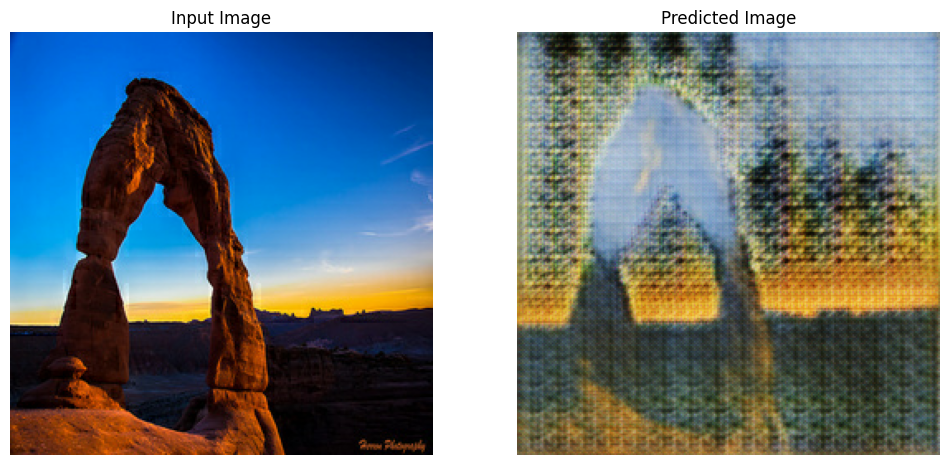

300it [01:10,  4.28it/s]


Epoch 21, gen loss=5.210927963256836, disc loss=1.2085011005401611


300it [01:08,  4.35it/s]


Epoch 22, gen loss=5.226194858551025, disc loss=1.180240273475647


300it [01:09,  4.35it/s]


Epoch 23, gen loss=5.1374993324279785, disc loss=1.1851544380187988


300it [01:09,  4.33it/s]


Epoch 24, gen loss=5.151546955108643, disc loss=1.1631087064743042


300it [01:08,  4.35it/s]


Epoch 25, gen loss=5.152256488800049, disc loss=1.1184176206588745


300it [01:09,  4.32it/s]


Epoch 26, gen loss=5.164464473724365, disc loss=1.0596423149108887


300it [01:08,  4.35it/s]


Epoch 27, gen loss=5.15352201461792, disc loss=1.0738624334335327


300it [01:09,  4.30it/s]


Epoch 28, gen loss=5.043089866638184, disc loss=1.0704094171524048


300it [01:08,  4.37it/s]


Epoch 29, gen loss=4.936672210693359, disc loss=1.0661627054214478


300it [01:07,  4.43it/s]


Epoch 30, gen loss=4.868950366973877, disc loss=1.0675054788589478


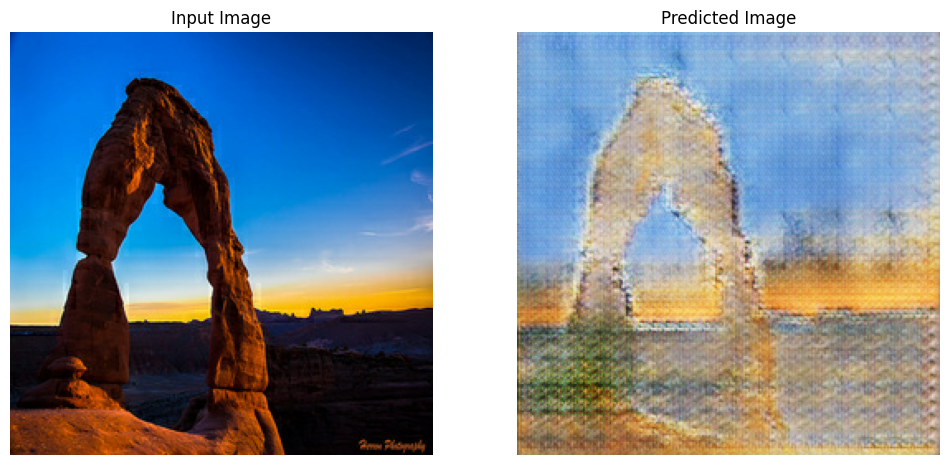

300it [01:08,  4.35it/s]


Epoch 31, gen loss=4.75577974319458, disc loss=1.0757592916488647


300it [01:08,  4.37it/s]


Epoch 32, gen loss=4.765149116516113, disc loss=1.0630908012390137


300it [01:08,  4.38it/s]


Epoch 33, gen loss=4.647647380828857, disc loss=1.0887609720230103


300it [01:08,  4.38it/s]


Epoch 34, gen loss=4.6468095779418945, disc loss=1.0486172437667847


300it [01:07,  4.42it/s]


Epoch 35, gen loss=4.584646701812744, disc loss=1.0956039428710938


300it [01:08,  4.37it/s]


Epoch 36, gen loss=4.4836554527282715, disc loss=1.1127370595932007


300it [01:07,  4.44it/s]


Epoch 37, gen loss=4.462875843048096, disc loss=1.0700936317443848


300it [01:08,  4.39it/s]


Epoch 38, gen loss=4.520252227783203, disc loss=1.0882376432418823


300it [01:07,  4.41it/s]


Epoch 39, gen loss=4.550134181976318, disc loss=1.043526530265808


300it [01:07,  4.42it/s]


Epoch 40, gen loss=4.44595193862915, disc loss=1.077694058418274


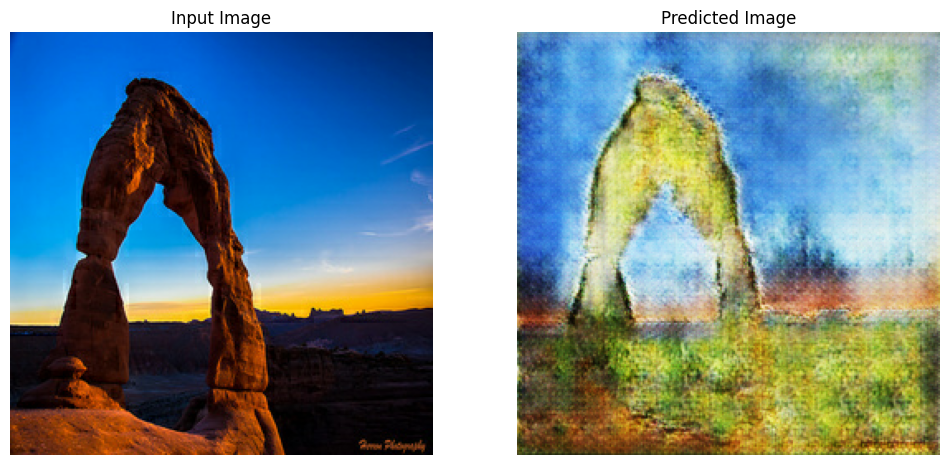

In [ ]:
gan_history = train(tf.data.Dataset.zip((photo_dataset, monet_dataset)), EPOCHS)

In [ ]:
# save the models
generator.save(base_path + 'models/generator.keras')
discriminator.save(base_path + 'models/discriminator.keras')

In [ ]:
# load the models
generator = tf.keras.models.load_model(base_path + 'models/generator.keras')
discriminator = tf.keras.models.load_model(base_path + 'models/discriminator.keras')

## Results and Analysis

We will evaluate the model's performance by generating images using the generator and comparing them to real Monet paintings. We will also visualize the training process by plotting the loss of the generator and discriminator over time.

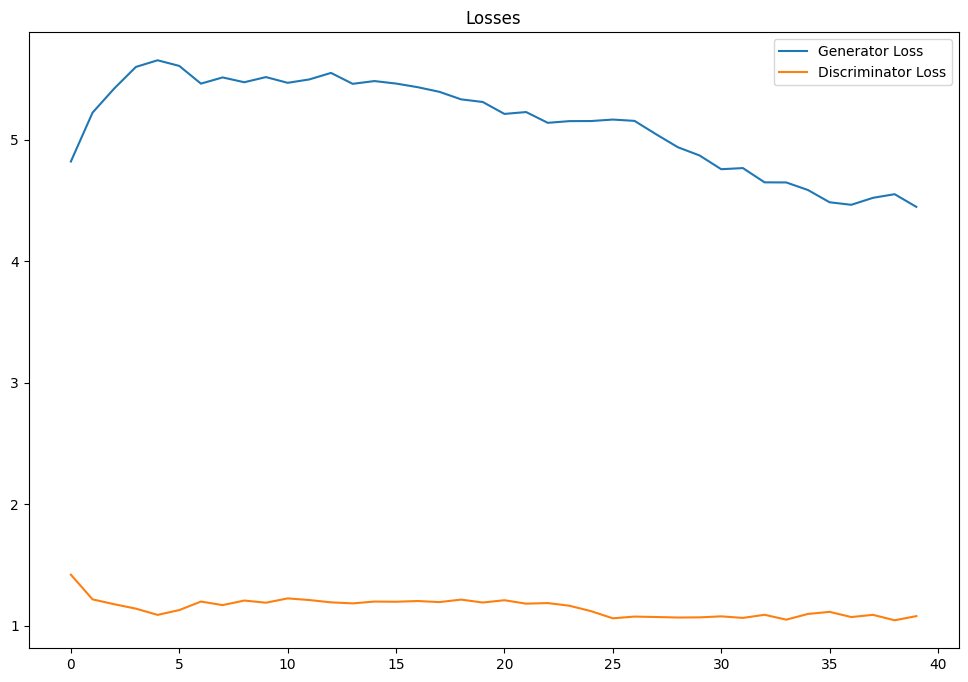

In [ ]:
# Losses by epoch
gen_loss = [x[0] for x in gan_history]
disc_loss = [x[1] for x in gan_history]

plt.figure(figsize=(12, 8))
plt.plot(gen_loss, label='Generator Loss')
plt.plot(disc_loss, label='Discriminator Loss')
plt.legend()
plt.title('Losses')
plt.show()

The generator loss increased for the first few epochs, but then began to decrease and eventually stabilized. The discriminator loss decreased over time, indicating that the discriminator was able to distinguish between real and fake Monet paintings.

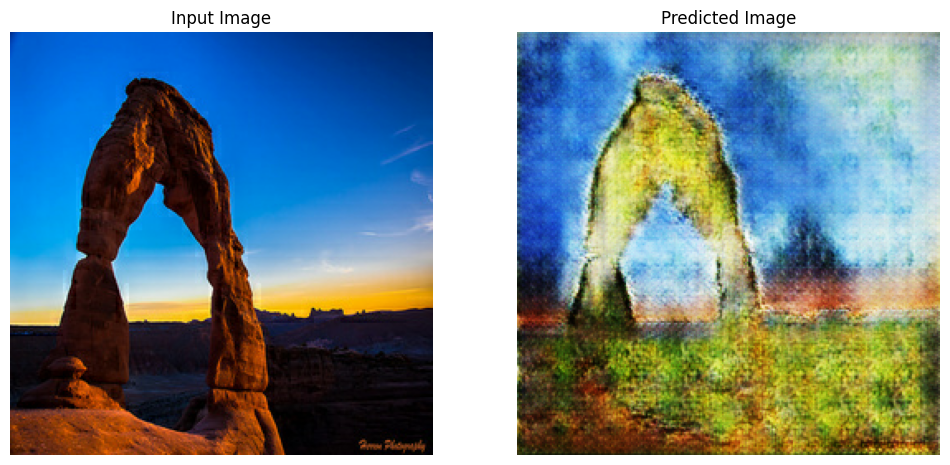

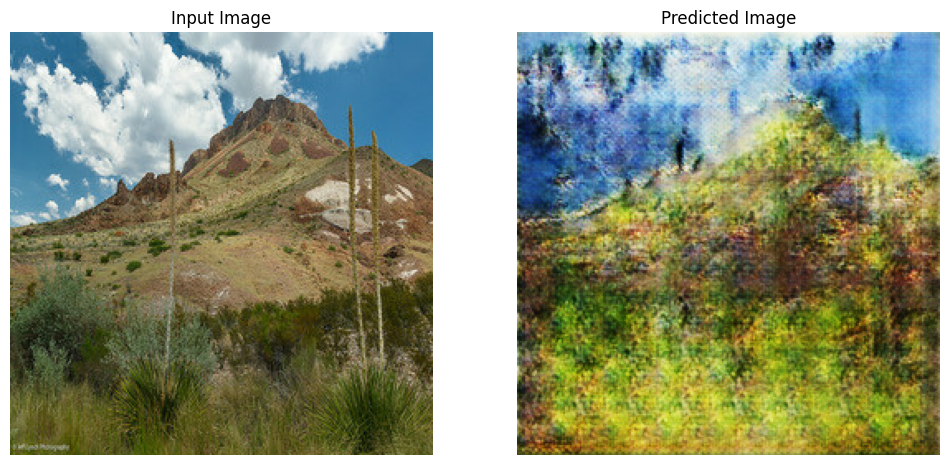

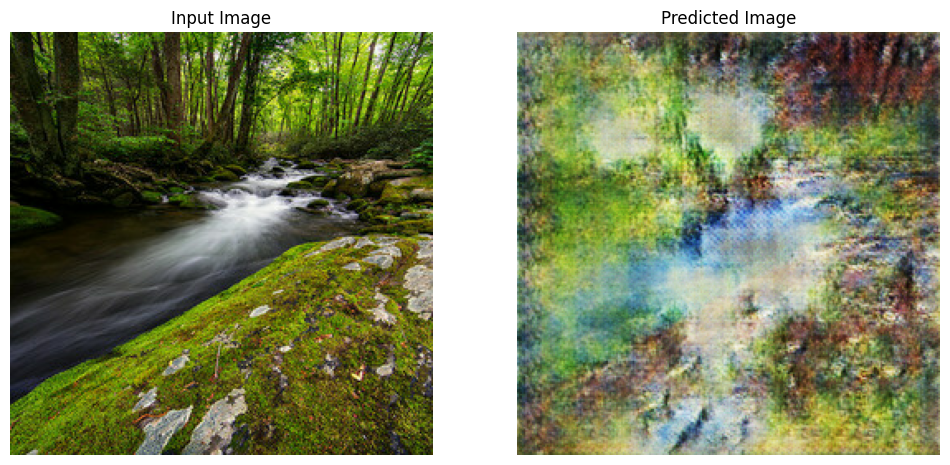

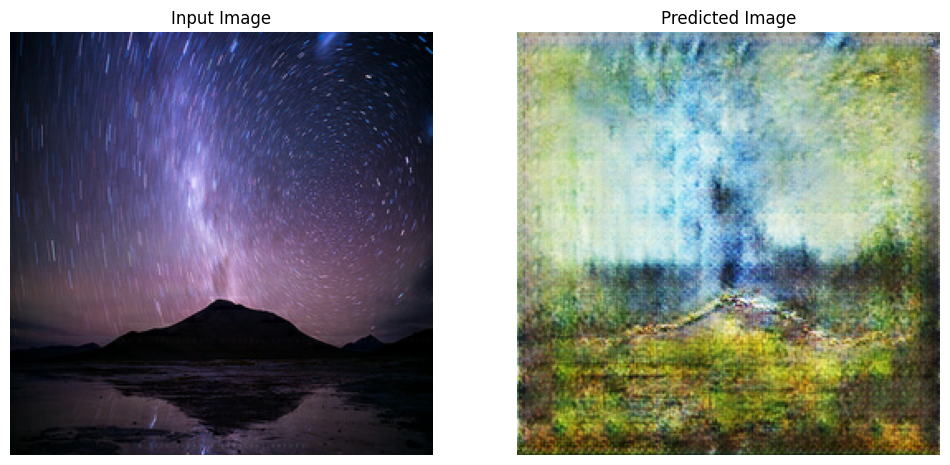

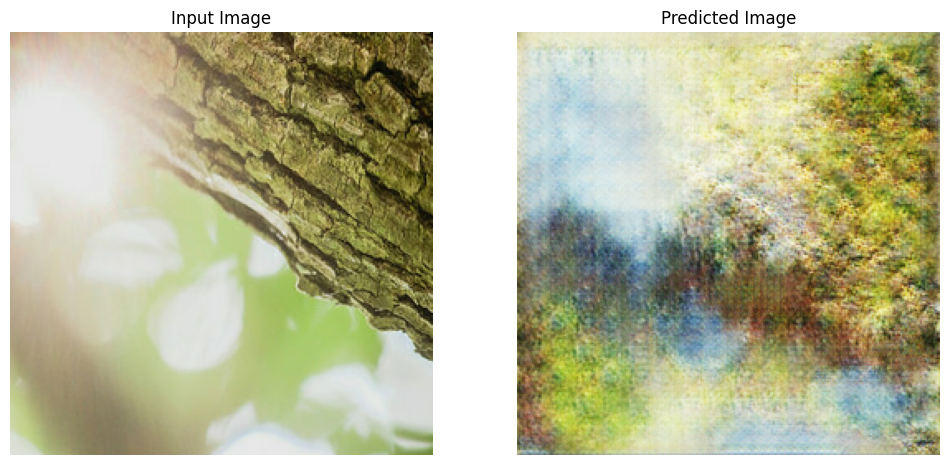

In [ ]:
# Generate a few images
for photo in photo_dataset.take(5):
    generate_images(generator, photo)

Inspecting a few generated images, we see that the model was able to generate images that resemble Monet paintings. The images have a similar color palette and style to the real Monet paintings. However, they lack the detail that real Monet paintings have, and some of the images are blurry or distorted.

In [ ]:
# Generate predictions to submit to Kaggle
import shutil
shutil.rmtree(base_path + 'images', ignore_errors=True)
os.makedirs(base_path + 'images', exist_ok=True)
for i, photo in enumerate(photo_dataset):
    prediction = generator(photo, training=True)
    plt.imsave(base_path + 'images/' + str(i) + '.jpg', (prediction[0] * 0.5 + 0.5).numpy()) 
    if i % 1000 == 0:
        print(f'Generated {i} images')

# zip the predictions
shutil.make_archive(base_path + 'images', 'zip', base_path + 'images')

Generated 0 images
Generated 1000 images
Generated 2000 images
Generated 3000 images
Generated 4000 images
Generated 5000 images
Generated 6000 images
Generated 7000 images


'/Users/kevin.katzmann/Dropbox/School/CU Boulder/Courses/DTSA-5511/Week 5/something-of-a-painter-myself/predictions.zip'

## Conclusion

We successfully designed and trained a GAN model to generate images of paintings in the style of Claude Monet! The model was able to generate images that resemble Monet paintings, but lacked the detail and realism of real Monet paintings.

Future work should explore additional hyperparameter tuning and model architectures to improve the model's performance. A more complex generator model could be used to generate more detailed images, but it will need to be balanced with the discriminator model to avoid overfitting.

### References
- [Monet CycleGAN Tutorial](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook)
- [Deep Convolutional Generative Adversarial Network](https://www.tensorflow.org/tutorials/generative/dcgan)